# Football AI

---

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/roboflow/sports)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/camera-calibration-sports-computer-vision/)
[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://www.youtube.com/watch?v=aBVGKoNZQUw)

Let's build a Football AI system to dig deeper into match stats! We'll use computer vision and machine learning to track players, determine which team is which, and even calculate stuff like ball possession and speed. This tutorial is perfect if you want to get hands-on with sports analytics and see how AI can take your football analysis to the next level.

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-diagram.png)

## Before you start

### Configure your API keys

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Fri Aug 30 10:09:27 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   40C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install dependencjes

**Note:** Let's install the `inference-gpu` library, which will be used to efficiently run our object detection and keypoint detection models on GPUs. `inference-gpu` utilizes the `onnxruntime-gpu` library internally for optimal performance. We'll install a specific version of `onnxruntime-gpu` to guarantee compatibility with the CUDA 12 environment in Google Colab.

In [1]:
# Install gdown and inference (CPU version)
!pip3 install -q gdown inference

# Install ONNX Runtime for CPU (Mac-compatible version)
!pip3 install -q onnxruntime

You should consider upgrading via the '/Users/phl18/Documents/PITCH_DETECTOR/venv/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/phl18/Documents/PITCH_DETECTOR/venv/bin/python3 -m pip install --upgrade pip' command.


**Note:** Let's install the sports repository directly from GitHub. The sports repository contains a variety of football-related utilities that we'll use along the way.

In [2]:
!pip3 install -q git+https://github.com/roboflow/sports.git

You should consider upgrading via the '/Users/phl18/Documents/PITCH_DETECTOR/venv/bin/python3 -m pip install --upgrade pip' command.


**Note:** Let's make sure we have the latest features in the supervision library by installing version `0.23.0` or higher.

In [3]:
!pip3 uninstall -y supervision && pip3 install -q supervision>=0.23.0

Found existing installation: supervision 0.25.1
Uninstalling supervision-0.25.1:
  Successfully uninstalled supervision-0.25.1
zsh:1: 0.23.0 not found


**Note:** Let's download a few sample videos from the [DFL - Bundesliga Data Shootout](https://www.kaggle.com/competitions/dfl-bundesliga-data-shootout) Kaggle competition using gdown.



In [4]:
!gdown -O "0bfacc_0.mp4" "https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF"
!gdown -O "2e57b9_0.mp4" "https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf"
!gdown -O "08fd33_0.mp4" "https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-"
!gdown -O "573e61_0.mp4" "https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU"
!gdown -O "121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

Downloading...
From: https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF
To: /Users/phl18/Downloads/0bfacc_0.mp4
100%|██████████████████████████████████████| 19.9M/19.9M [00:02<00:00, 9.10MB/s]
Downloading...
From: https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf
To: /Users/phl18/Downloads/2e57b9_0.mp4
100%|██████████████████████████████████████| 21.1M/21.1M [00:01<00:00, 13.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-
To: /Users/phl18/Downloads/08fd33_0.mp4
100%|██████████████████████████████████████| 19.9M/19.9M [00:02<00:00, 7.44MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU
To: /Users/phl18/Downloads/573e61_0.mp4
100%|██████████████████████████████████████| 18.9M/18.9M [00:03<00:00, 5.91MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu
To: /Users/phl18/Downloads/121364_0.mp4
100%|██████████████████████████████████████| 1

In [5]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

In [ ]:
!pip3 install --upgrade --force-reinstall numpy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 59.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 0.45.0 requires numpy<=1.26.4, but you have numpy 2.2.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.
pymc 5.21.1 requires rich>=13.7.1, but you have rich 13.0.1 which is incompatible.
albumentations 2.0.5 requires pydantic>=2.9.2, but you have pydantic 2.6.4 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.4 which is incompatible.


In [9]:
!pip uninstall -y numpy
!pip install numpy

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
  Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.4 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 0.45.0 requires numpy<=1.26.4, but you have numpy 2.2.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.
pymc 5.21.1 requires rich>=13.7.1, but you have rich 13.0.1 which is incompatible.
albumentations 2.0.5 requires pydantic>=2.9.2, but you have pydantic 2.6.4 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.4 which is incompatible.


## ball, player, goalkeeper and referee detection

In [20]:
!pip3 install jupyter google-colab

KeyboardInterrupt: 

In [3]:
!pip3 install supervision

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip' command.


In [115]:

from inference import get_model
from getpass import getpass

ROBOFLOW_API_KEY = "tCX9srOm8qVKr64lJVcb"
PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/12"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

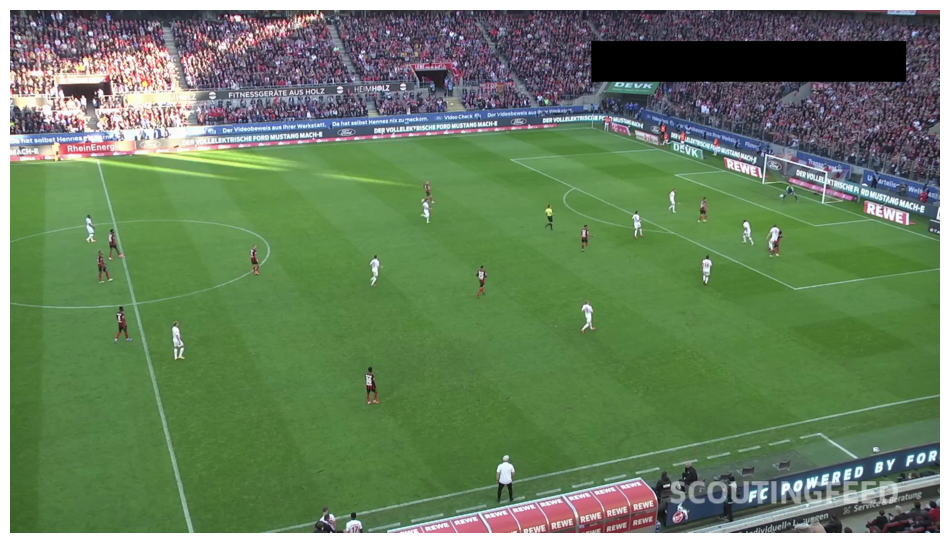

In [79]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

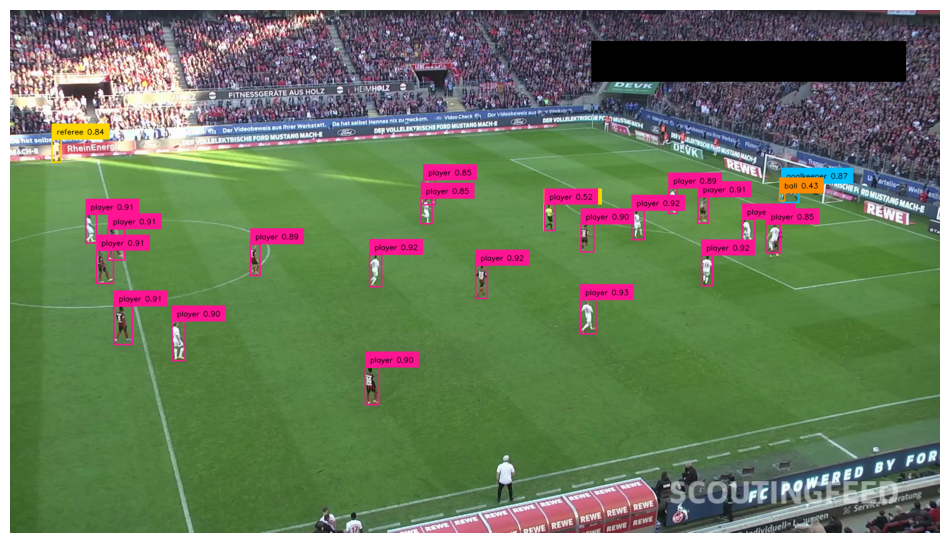

In [80]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

In [52]:
# video out put 
import supervision as sv
import cv2

# Define paths
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "annotated_output.mp4"

# Load the video
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)  # Read the first frame to get dimensions

# Get video properties
height, width, _ = frame.shape
fps = 30  # Adjust based on source video

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for MP4 format
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Initialize annotators
box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

# Process video frame-by-frame
for frame in sv.get_video_frames_generator(SOURCE_VIDEO_PATH):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Generate labels
    labels = [
        f"{class_name} {confidence:.2f}"
        for class_name, confidence in zip(detections['class_name'], detections.confidence)
    ]

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections, labels=labels)

    # Write frame to output video
    out.write(annotated_frame)

# Release the video writer
out.release()
print(f"Annotated video saved as {OUTPUT_VIDEO_PATH}")

KeyboardInterrupt: 

KeyboardInterrupt: 

## video game style visualization

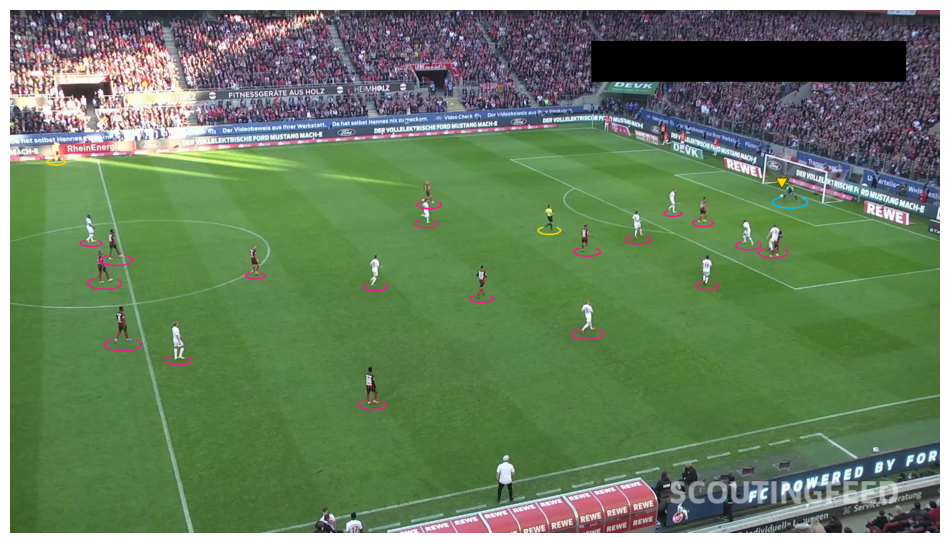

In [81]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

In [10]:
# video output
import supervision as sv
import cv2

# Define video paths
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/game_Style_visualisation.mp4"
BALL_ID = 0  # Ball class ID

# Initialize video reader
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)  # Read first frame for dimensions

# Get video properties
height, width, _ = frame.shape
fps = 30  # Adjust based on source video

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for MP4 format
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Initialize annotators
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# Process video frame-by-frame
for frame in sv.get_video_frames_generator(SOURCE_VIDEO_PATH):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Detect ball and players separately
    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections.class_id -= 1

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
    annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

    # Write frame to output video
    out.write(annotated_frame)

# Release the video writer
out.release()
print(f"Annotated video saved as {OUTPUT_VIDEO_PATH}")

Annotated video saved as /Users/phl18/Downloads/Football_output_vids/game_Style_visualisation.mp4


## player tracking

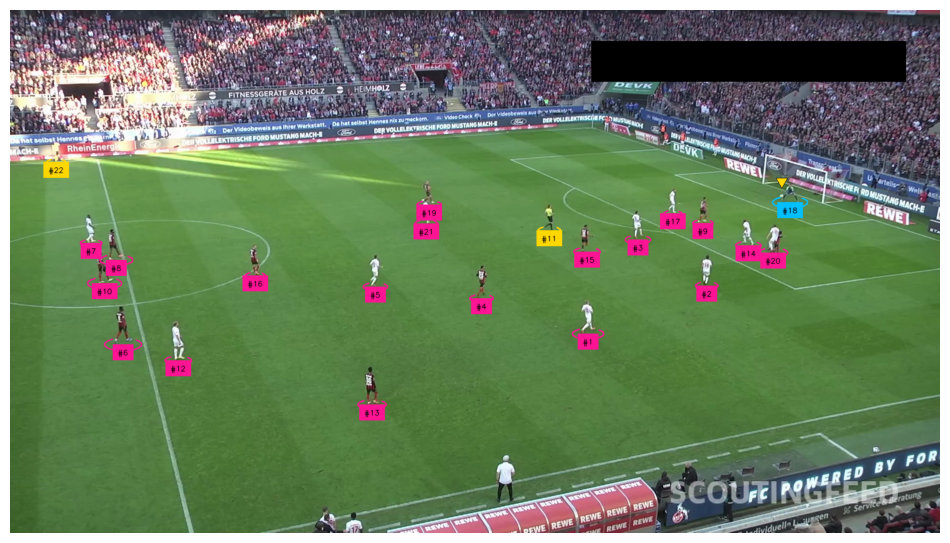

In [82]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

In [ ]:
# output Video code 
import supervision as sv
import cv2

# Define video paths
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/Player_Tracking.mp4"
BALL_ID = 0  # Ball class ID

# Initialize video reader
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)  # Read first frame for dimensions

# Get video properties
height, width, _ = frame.shape
fps = 30  # Adjust based on source video

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for MP4 format
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Initialize annotators
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# Initialize tracker
tracker = sv.ByteTrack()
tracker.reset()

# Process video frame-by-frame
for frame in sv.get_video_frames_generator(SOURCE_VIDEO_PATH):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Detect ball and players separately
    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections.class_id -= 1
    all_detections = tracker.update_with_detections(detections=all_detections)

    # Generate labels with tracker IDs
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
    annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

    # Write frame to output video
    out.write(annotated_frame)

# Release the video writer 
out.release()
print(f"Annotated video saved as {OUTPUT_VIDEO_PATH}")

Annotated video saved as /Users/phl18/Downloads/Football_output_vids/Player_Tracking.mp4


## split players into teams

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-team-clustering.png)

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

In [129]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "573e61_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 25it [00:05,  4.36it/s]


**Note:** Here's a sample (100 elements) of the crops we've gathered.

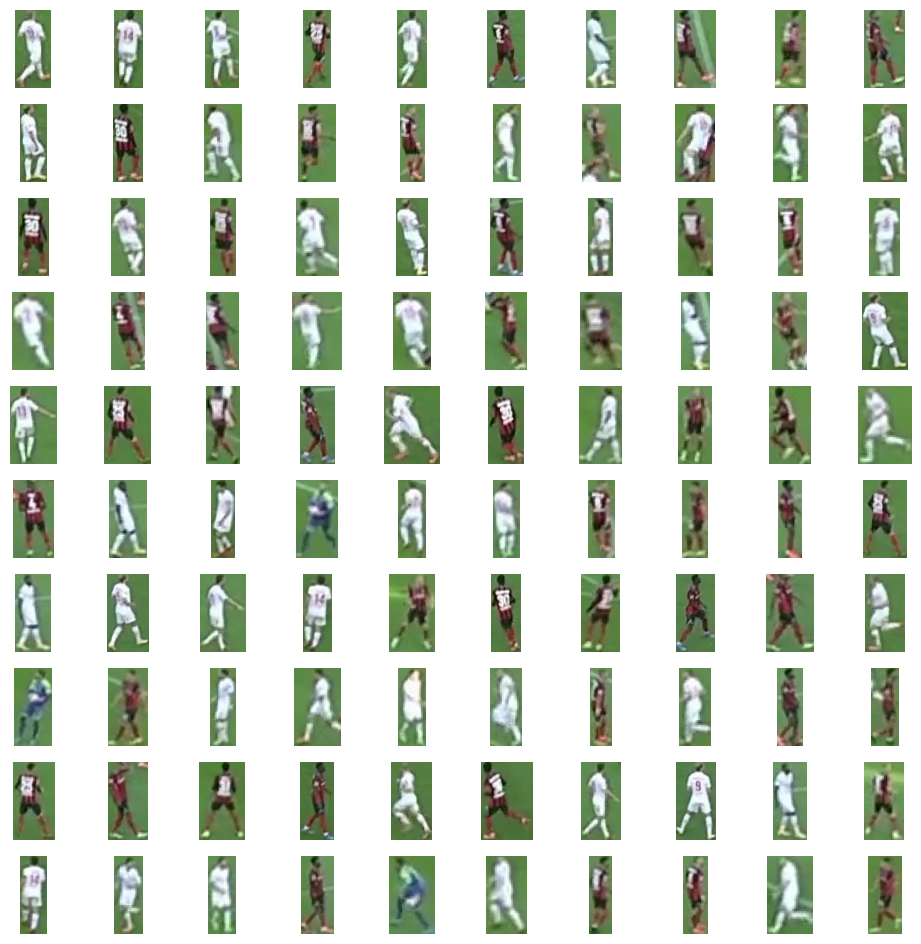

In [130]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

**Note:** Next, we'll run [SigLIP](https://huggingface.co/docs/transformers/en/model_doc/siglip) to calculate embeddings for each of the crops.

In [131]:
import numpy as np
def resolve_goalkeepers_team_id(
    players_detections:sv.Detections,
    goalkeepers_detections:sv.Detections,
):
  goalkeepers_xy=goalkeepers_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
  player_xy=players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
  
  team0_centroid=player_xy[players_detections.class_id==0].mean(axis=0)
  team1_centroid=player_xy[players_detections.class_id==1].mean(axis=0)
  
  goalkeepers_team_ids=[]
  for goalkeeper_xy in goalkeepers_xy:
      dist_0=np.linalg.norm(goalkeeper_xy-team0_centroid)
      dist_1=np.linalg.norm(goalkeeper_xy-team1_centroid)
      goalkeepers_team_ids.append(0 if dist_0<dist_1 else 1)
  return  np.array(goalkeepers_team_ids)
  
 

In [132]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

In [31]:
!pip3 install more_itertools

1009.55s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


  Using cached more_itertools-10.6.0-py3-none-any.whl (63 kB)
You should consider upgrading via the '/Users/phl18/Documents/PITCH_DETECTOR/venv/bin/python3 -m pip install --upgrade pip' command.


In [133]:

import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 16it [00:28,  1.77s/it]


**Note:** Using [UMAP](https://github.com/lmcinnes/umap), we project our embeddings from `(N, 768)` to `(N, 3)` and then perform a two-cluster division using [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

In [134]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [135]:
projections = REDUCER.fit_transform(data)
clusters = CLUSTERING_MODEL.fit_predict(projections)

/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [18]:
!pip3 install plotly

Defaulting to user installation because normal site-packages is not writeable
  Using cached plotly-6.0.1-py3-none-any.whl (14.8 MB)
  Using cached narwhals-1.33.0-py3-none-any.whl (322 kB)
You should consider upgrading via the '/Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip' command.


**Note:** Here's an interactive visualization of our results. Click on a dot to display its associated crop.

/var/folders/bv/rmvws9bx7s939d1pgj09_w540000gp/T/ipykernel_36912/3907098323.py:4: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display




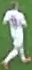
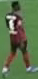
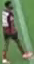
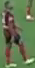
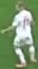
...
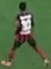
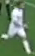
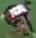
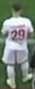
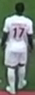

In [136]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.core.display import display, HTML
from PIL import Image
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))

display_projections(clusters, projections, crops)

**Note:** To simplify the use of the SigLIP, UMAP, and KMeans combo, I've packaged all these models into a [`TeamClassifier`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/team.py#L41) that you can find in the [sports](https://github.com/roboflow/sports) repository.

In [137]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "573e61_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

device = "mps" if torch.backends.mps.is_available() else "cpu"
team_classifier = TeamClassifier(device=device)
team_classifier.fit(crops)

collecting crops: 25it [00:06,  4.10it/s]
Embedding extraction: 20it [00:12,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



**Note:** Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

In [138]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



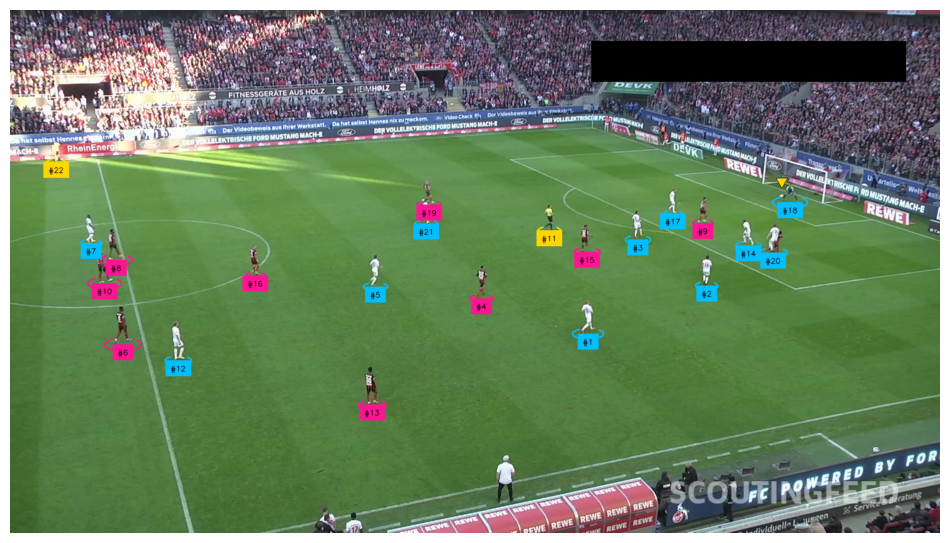

In [139]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

In [66]:
# output for team classification
import cv2
import numpy as np
import supervision as sv

# Define source and output video paths
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/classify_teams.mp4"

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Initialize annotators
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# Initialize tracker
tracker = sv.ByteTrack()
tracker.reset()

# Load video
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for .mp4 output
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Stop when video ends

    # Perform player detection
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Process ball detections
    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Process other detections
    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)

    # Separate detections by class
    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

    # Assign teams
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    players_detections.class_id = team_classifier.predict(players_crops)
    
    # Resolve goalkeeper team ID
    goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
        players_detections, goalkeepers_detections)

    referees_detections.class_id -= 1

    # Merge all detections
    all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])

    # Generate labels for tracking
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
    all_detections.class_id = all_detections.class_id.astype(int)

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
    annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

    # Write annotated frame to output video
    out.write(annotated_frame)

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video processing complete! Output saved as {OUTPUT_VIDEO_PATH}")

Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/var/folders/bv/rmvws9bx7s939d1pgj09_w540000gp/T/ipykernel_36912/319902704.py:11: RuntimeWarning:

Mean of empty slice.

/Users/phl18/Library/Python/3.9/lib/python/site-packages/numpy/core/_methods.py:121: RuntimeWarning:

invalid value encountered in divide

Embedding extraction: 1it [00:00,  2.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/var/folders/bv/rmvws9bx7s939d1pgj09_w540000gp/T/ipykernel_36912/319902704.py:11: RuntimeWarning:

Mean of empty slice.

/Users/phl18/Library/Python/3.9/lib/python/site-packages/numpy/core/_methods.py:121: RuntimeWarning:

invalid value encountered in divi

KeyboardInterrupt: 

## pitch keypoint detection

In [140]:
from inference import get_model


ROBOFLOW_API_KEY = 'tCX9srOm8qVKr64lJVcb'
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

/Users/phl18/Library/Python/3.9/lib/python/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'

/Users/phl18/Library/Python/3.9/lib/python/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'OpenVINOExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'



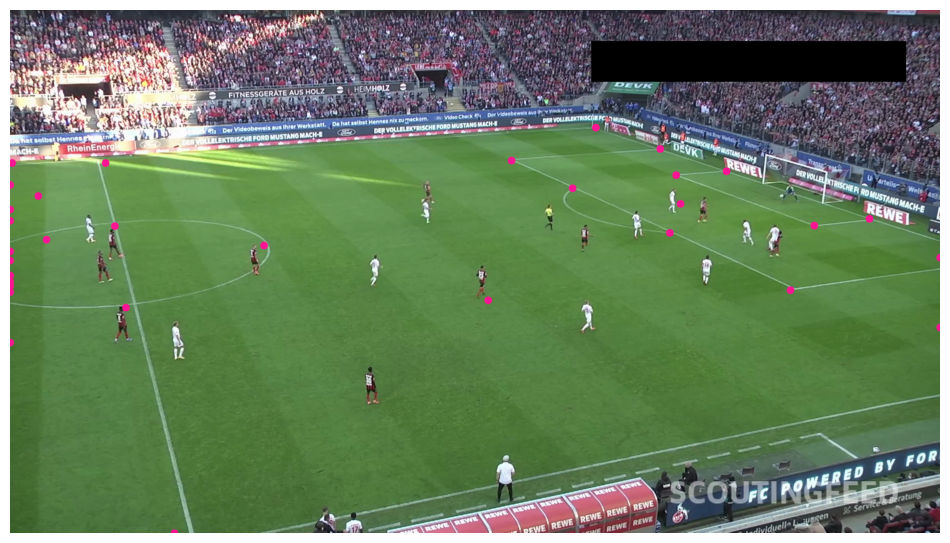

In [141]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

In [24]:
# output video
import supervision as sv
import cv2

# Define input and output video paths
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/Key_point_detector.mp4"

# Initialize video reader
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)  # Read first frame for dimensions

# Get video properties
height, width, _ = frame.shape
fps = 30  # Adjust based on source video

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for MP4 format
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Initialize annotator
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)

# Process video frame-by-frame
for frame in sv.get_video_frames_generator(SOURCE_VIDEO_PATH):
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = vertex_annotator.annotate(
        scene=annotated_frame,
        key_points=key_points
    )

    # Write frame to output video
    out.write(annotated_frame)

# Release the video writer
out.release()
print(f"Annotated video saved as {OUTPUT_VIDEO_PATH}")

Annotated video saved as /Users/phl18/Downloads/Football_output_vids/Key_point_detector.mp4


**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

## filter low confidence keypoints

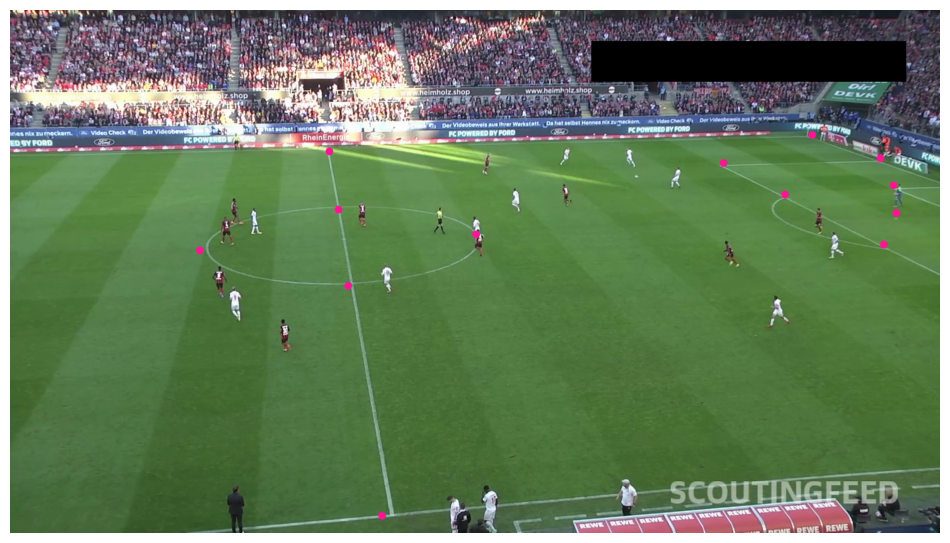

In [142]:
import supervision as sv

SOURCE_VIDEO_PATH = "573e61_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

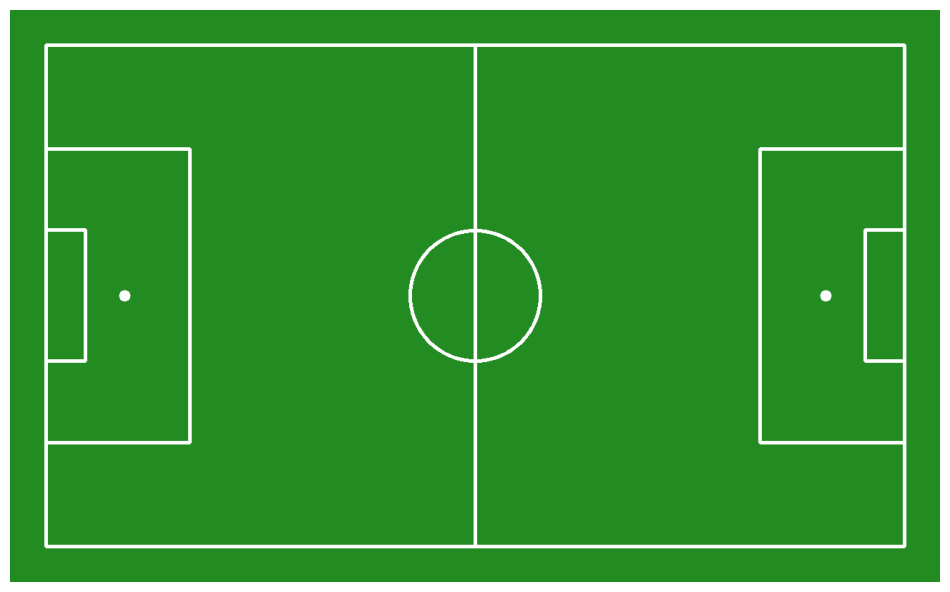

In [143]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

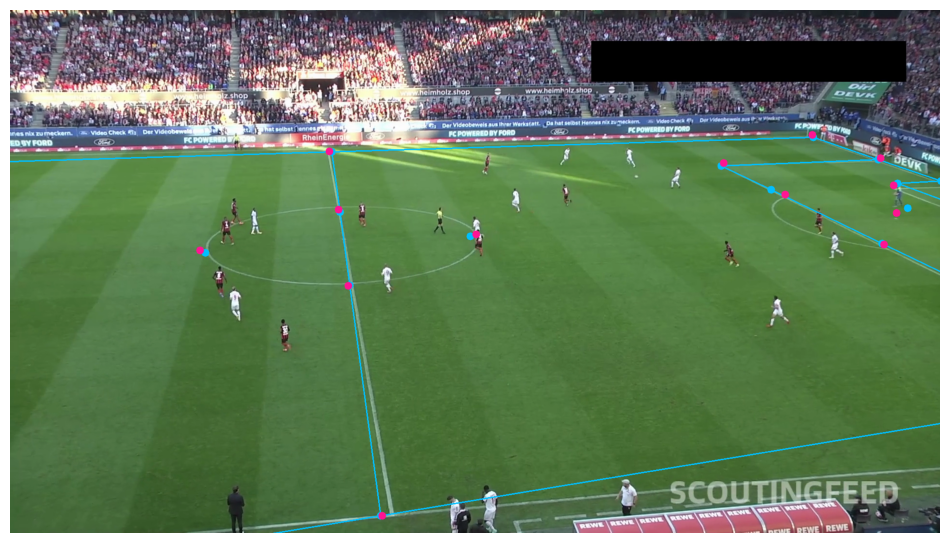

In [144]:
import numpy as np
import supervision as sv
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "573e61_0.mp4"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project ball, players and referies on pitch

In [128]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/Users/phl18/Documents/HOH_Vetex_Termsheet/classify_teams.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

device = "mps" if torch.backends.mps.is_available() else "cpu"
team_classifier = TeamClassifier(device=device)

team_classifier.fit(crops)

collecting crops: 25it [00:05,  4.65it/s]
Embedding extraction: 6it [00:04,  1.25it/s]


KeyboardInterrupt: 

In [145]:
import cv2
from typing import Optional

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Increase steepness of the blend effect
    steepness = 15  # Increased steepness for sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Create the smooth color transition
    for c in range(3):  # Iterate over the B, G, R channels
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                            (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

Embedding extraction: 1it [00:00,  1.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



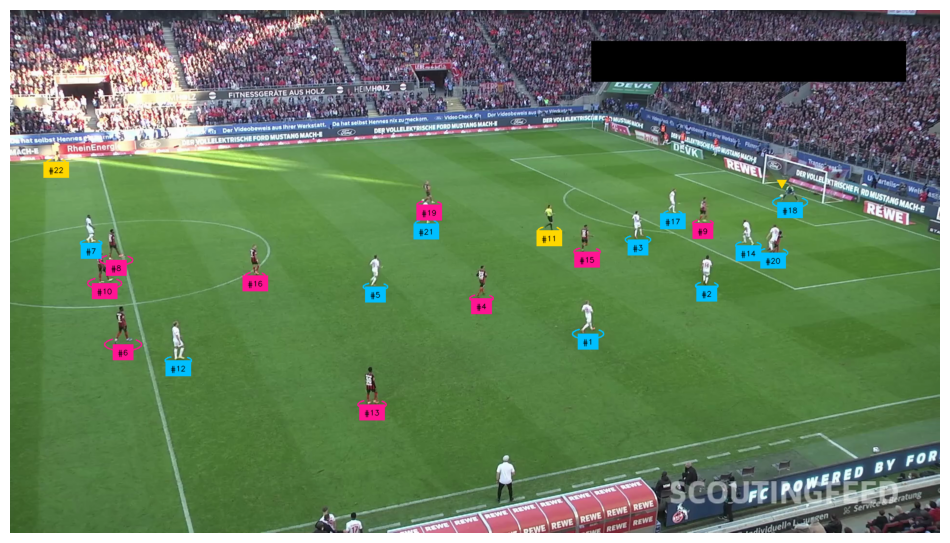

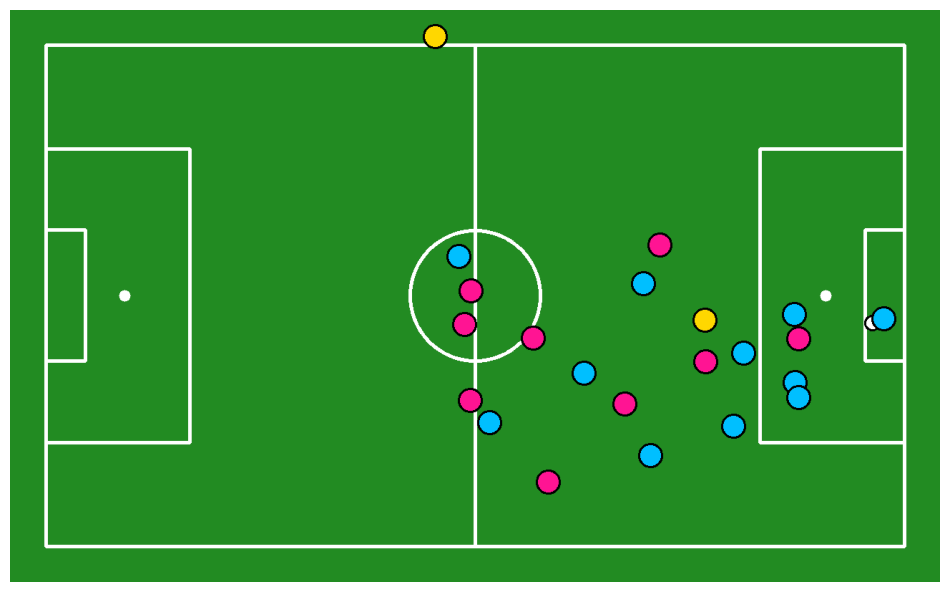

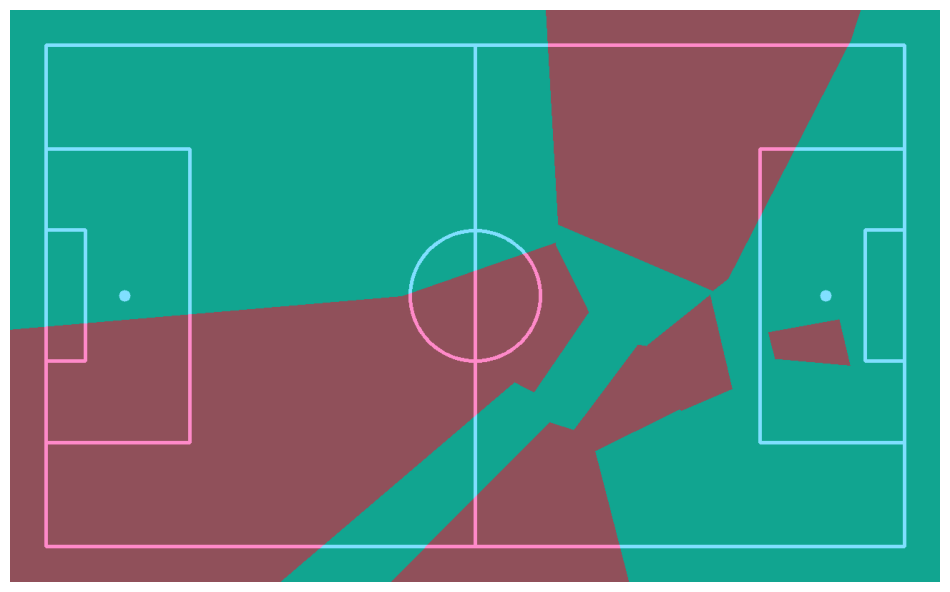

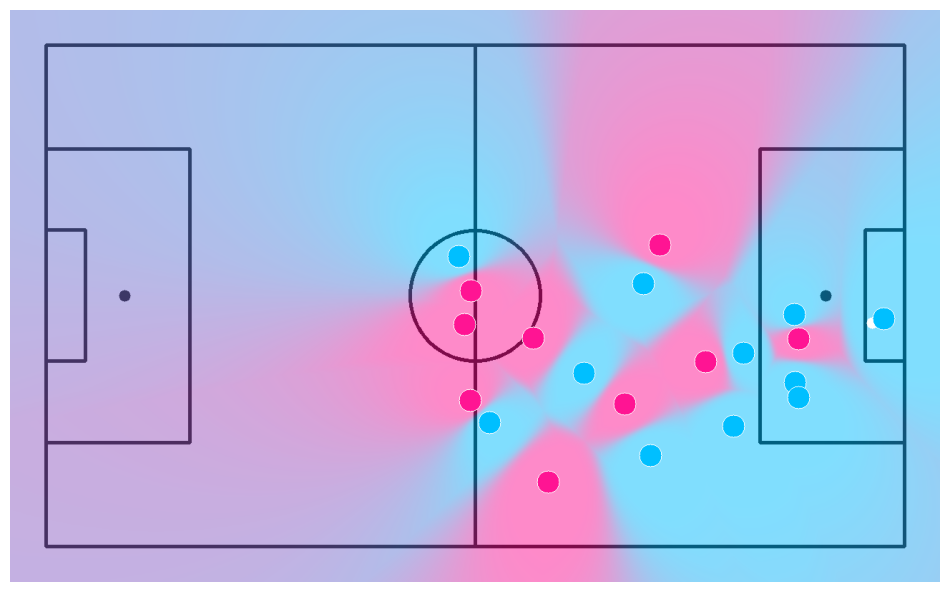

In [146]:
import supervision as sv
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)

SOURCE_VIDEO_PATH = "573e61_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.transform_points(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# visualize video game-style radar view

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_pitch_voronoi_diagram(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram with blend

annotated_frame = draw_pitch(
    config=CONFIG,
    background_color=sv.Color.WHITE,
    line_color=sv.Color.BLACK
)
annotated_frame = draw_pitch_voronoi_diagram_2(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.WHITE,
    radius=8,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [147]:
import supervision as sv
import numpy as np
import cv2
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)

SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/team_2d_soccer_combined.mp4"  # Output path for the processed video

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Initialize annotators
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

# Initialize tracker
tracker = sv.ByteTrack()
tracker.reset()

# Get video information
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_width, frame_height = video_info.width, video_info.height
fps = video_info.fps

# Create video writers for different views
pitch_width, pitch_height = 1300, 800  # Adjust as needed

# Video writer for original annotated view
video_writer_original = cv2.VideoWriter(
    "original_" + OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (frame_width, frame_height)
)

# Video writer for 2D pitch view
video_writer_pitch = cv2.VideoWriter(
    "pitch_" + OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (pitch_width, pitch_height)
)

# Video writer for voronoi diagram view
video_writer_voronoi = cv2.VideoWriter(
    "voronoi_" + OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (pitch_width, pitch_height)
)

# Video writer for side-by-side view (original + pitch)
combined_width = frame_width + pitch_width
combined_height = max(frame_height, pitch_height)
video_writer_combined = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (combined_width, combined_height)
)

# Process all frames
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

for frame_idx, frame in enumerate(frame_generator):
    print(f"Processing frame {frame_idx}")
    
    try:
        # 1. Ball, goalkeeper, player, referee detection
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)
        # Handle different possible output formats
        if isinstance(result, list) and len(result) > 0:
            result = result[0]
        
        detections = sv.Detections.from_inference(result)
        
        # Extract ball detections
        ball_detections = detections[detections.class_id == BALL_ID]
        if len(ball_detections) > 0:
            ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
        
        # Process other detections (players, goalkeepers, referees)
        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)
        
        goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
        players_detections = all_detections[all_detections.class_id == PLAYER_ID]
        referees_detections = all_detections[all_detections.class_id == REFEREE_ID]
        
        # 2. Team assignment
       # Crop player images from the frame
        players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]

# Classify players into teams
        players_detections.class_id = team_classifier.predict(players_crops)

# Assign goalkeepers to the appropriate team
        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections, goalkeepers_detections)

# Adjust referee class ID to differentiate them from teams
        referees_detections.class_id -= 1
        all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])
        
        # 3. Frame visualization
        labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
        
        if len(all_detections) > 0:
            all_detections.class_id = all_detections.class_id.astype(int)
        
        # Annotate original frame
        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(
            scene=annotated_frame,
            detections=all_detections)
        annotated_frame = label_annotator.annotate(
            scene=annotated_frame,
            detections=all_detections,
            labels=labels)
        
        if len(ball_detections) > 0:
            annotated_frame = triangle_annotator.annotate(
                scene=annotated_frame,
                detections=ball_detections)
        
        # Merge player and goalkeeper detections for visualization
        players_detections = sv.Detections.merge([
            players_detections, goalkeepers_detections
        ]) if any([len(x) > 0 for x in [players_detections, goalkeepers_detections]]) else sv.Detections.empty()
        
        # 4. Detect pitch key points
        result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)
        if isinstance(result, list) and len(result) > 0:
            result = result[0]
        key_points = sv.KeyPoints.from_inference(result)
        
        # 5. Project players, ball and referees onto the pitch
        pitch_view = draw_pitch(CONFIG)
        voronoi_view = draw_pitch(CONFIG)
        
        try:
            if hasattr(key_points, 'confidence') and len(key_points.confidence) > 0:
                filter_mask = key_points.confidence[0] > 0.5
                frame_reference_points = key_points.xy[0][filter_mask]
                pitch_reference_points = np.array(CONFIG.vertices)[filter_mask]
                
                if len(frame_reference_points) >= 4:  # Need enough points for transformation
                    transformer = ViewTransformer(
                        source=frame_reference_points,
                        target=pitch_reference_points
                    )
                    
                    # Project ball
                    if len(ball_detections) > 0:
                        frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
                        pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
                        
                        pitch_view = draw_points_on_pitch(
                            config=CONFIG,
                            xy=pitch_ball_xy,
                            face_color=sv.Color.WHITE,
                            edge_color=sv.Color.BLACK,
                            radius=10,
                            pitch=pitch_view)
                    
                    # Project players
                    if len(players_detections) > 0:
                        players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
                        pitch_players_xy = transformer.transform_points(points=players_xy)
                        
                        # Draw team 1
                        team_1_mask = players_detections.class_id == 0
                        if np.any(team_1_mask):
                            pitch_view = draw_points_on_pitch(
                                config=CONFIG,
                                xy=pitch_players_xy[team_1_mask],
                                face_color=sv.Color.from_hex('00BFFF'),
                                edge_color=sv.Color.BLACK,
                                radius=16,
                                pitch=pitch_view)
                        
                        # Draw team 2
                        team_2_mask = players_detections.class_id == 1
                        if np.any(team_2_mask):
                            pitch_view = draw_points_on_pitch(
                                config=CONFIG,
                                xy=pitch_players_xy[team_2_mask],
                                face_color=sv.Color.from_hex('FF1493'),
                                edge_color=sv.Color.BLACK,
                                radius=16,
                                pitch=pitch_view)
                    
                    # Project referees
                    if len(referees_detections) > 0:
                        referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
                        pitch_referees_xy = transformer.transform_points(points=referees_xy)
                        
                        pitch_view = draw_points_on_pitch(
                            config=CONFIG,
                            xy=pitch_referees_xy,
                            face_color=sv.Color.from_hex('FFD700'),
                            edge_color=sv.Color.BLACK,
                            radius=16,
                            pitch=pitch_view)
                    
                    # 6. Create Voronoi diagram
                    if len(players_detections) > 0:
                        team_1_mask = players_detections.class_id == 0
                        team_2_mask = players_detections.class_id == 1
                        
                        if np.any(team_1_mask) and np.any(team_2_mask):
                            try:
                                voronoi_view = draw_pitch_voronoi_diagram(
                                    config=CONFIG,
                                    team_1_xy=pitch_players_xy[team_1_mask],
                                    team_2_xy=pitch_players_xy[team_2_mask],
                                    team_1_color=sv.Color.from_hex('00BFFF'),
                                    team_2_color=sv.Color.from_hex('FF1493'),
                                    pitch=voronoi_view)
                                
                                # Add players and ball to the Voronoi view
                                if len(ball_detections) > 0:
                                    voronoi_view = draw_points_on_pitch(
                                        config=CONFIG,
                                        xy=pitch_ball_xy,
                                        face_color=sv.Color.WHITE,
                                        edge_color=sv.Color.WHITE,
                                        radius=8,
                                        thickness=1,
                                        pitch=voronoi_view)
                                
                                voronoi_view = draw_points_on_pitch(
                                    config=CONFIG,
                                    xy=pitch_players_xy[team_1_mask],
                                    face_color=sv.Color.from_hex('00BFFF'),
                                    edge_color=sv.Color.WHITE,
                                    radius=16,
                                    thickness=1,
                                    pitch=voronoi_view)
                                
                                voronoi_view = draw_points_on_pitch(
                                    config=CONFIG,
                                    xy=pitch_players_xy[team_2_mask],
                                    face_color=sv.Color.from_hex('FF1493'),
                                    edge_color=sv.Color.WHITE,
                                    radius=16,
                                    thickness=1,
                                    pitch=voronoi_view)
                            except Exception as e:
                                print(f"Error drawing Voronoi diagram: {e}")
        except Exception as e:
            print(f"Error in projection: {e}")
        
        # Convert to BGR for OpenCV (if needed)
        if annotated_frame.shape[2] == 3:  # Check if RGB
            annotated_frame_bgr = cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR)
            pitch_view_bgr = cv2.cvtColor(pitch_view, cv2.COLOR_RGB2BGR)
            voronoi_view_bgr = cv2.cvtColor(voronoi_view, cv2.COLOR_RGB2BGR)
        else:
            annotated_frame_bgr = annotated_frame
            pitch_view_bgr = pitch_view
            voronoi_view_bgr = voronoi_view
        
        # Create combined view (original + pitch)
        combined_frame = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)
        combined_frame[0:frame_height, 0:frame_width] = annotated_frame_bgr
        combined_frame[0:pitch_height, frame_width:frame_width+pitch_width] = pitch_view_bgr
        
        # Write frames to video
        video_writer_original.write(annotated_frame_bgr)
        video_writer_pitch.write(pitch_view_bgr)
        video_writer_voronoi.write(voronoi_view_bgr)
        video_writer_combined.write(combined_frame)
        
    except Exception as e:
        print(f"Error processing frame {frame_idx}: {e}")
        # Write the original frame in case of error
        if 'frame' in locals():
            frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
            video_writer_original.write(frame_bgr)
            
            # Create blank pitch and combined views
            blank_pitch = np.zeros((pitch_height, pitch_width, 3), dtype=np.uint8)
            blank_combined = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)
            blank_combined[0:frame_height, 0:frame_width] = frame_bgr
            
            video_writer_pitch.write(blank_pitch)
            video_writer_voronoi.write(blank_pitch)
            video_writer_combined.write(blank_combined)

# Release all video writers
video_writer_original.release()
video_writer_pitch.release()
video_writer_voronoi.release()
video_writer_combined.release()

print("Video processing complete!")
print(f"Output videos saved as:")

print(f"2. Pitch view: pitch_{OUTPUT_VIDEO_PATH}")
print(f"3. Voronoi view: voronoi_{OUTPUT_VIDEO_PATH}")
print(f"4. Combined view: {OUTPUT_VIDEO_PATH}")

Processing frame 0


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 1


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 2


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 3


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 4


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 5


Embedding extraction: 1it [00:00,  2.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 6


Embedding extraction: 1it [00:00,  2.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 7


Embedding extraction: 1it [00:00,  2.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 8


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 9


Embedding extraction: 1it [00:00,  2.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 10


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 11


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 12


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 13


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 14


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 15


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 16


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 17


Embedding extraction: 1it [00:00,  2.31it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 18


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 19


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 20


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 21


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 22


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 23


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 24


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 25


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 26


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 27


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 28


Embedding extraction: 1it [00:00,  2.14it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 29


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 30


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 31


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 32


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 33


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 34


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 35


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 36


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 37


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 38


Embedding extraction: 1it [00:00,  2.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 39


Embedding extraction: 1it [00:00,  2.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 40


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 41


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 42


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 43


Embedding extraction: 1it [00:00,  2.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 44


Embedding extraction: 1it [00:00,  2.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 45


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 46


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 47


Embedding extraction: 1it [00:00,  2.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 48


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 49


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 50


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 51


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 52


Embedding extraction: 1it [00:00,  2.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 53


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 54


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 55


Embedding extraction: 1it [00:00,  2.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 56


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 57


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 58


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 59


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 60


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 61


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 62


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 63


Embedding extraction: 1it [00:00,  2.29it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 64


Embedding extraction: 1it [00:00,  2.26it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 65


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 66


Embedding extraction: 1it [00:00,  1.91it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 67


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 68


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 69


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 70


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 71


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 72


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 73


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 74


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 75


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 76


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 77


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 78


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 79


Embedding extraction: 1it [00:00,  2.22it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 80


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 81


Embedding extraction: 1it [00:00,  2.26it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 82


Embedding extraction: 1it [00:00,  2.27it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 83


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 84


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 85


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 86


Embedding extraction: 1it [00:00,  2.23it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 87


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 88


Embedding extraction: 1it [00:00,  2.10it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 89


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 90


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 91


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 92


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 93


Embedding extraction: 1it [00:00,  2.22it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 94


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 95


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 96


Embedding extraction: 1it [00:00,  2.08it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 97


Embedding extraction: 1it [00:00,  2.08it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 98


Embedding extraction: 1it [00:00,  2.11it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 99


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 100


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 101


Embedding extraction: 1it [00:00,  2.18it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 102


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 103


Embedding extraction: 1it [00:00,  2.28it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 104


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 105


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 106


Embedding extraction: 1it [00:00,  2.18it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 107


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 108


Embedding extraction: 1it [00:00,  2.18it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 109


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 110


Embedding extraction: 1it [00:00,  2.16it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 111


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 112


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 113


Embedding extraction: 1it [00:00,  2.11it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 114


Embedding extraction: 1it [00:00,  2.02it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 115


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 116


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 117


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 118


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 119


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 120


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 121


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 122


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 123


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 124


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 125


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 126


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 127


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 128


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 129


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 130


Embedding extraction: 1it [00:00,  1.66it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 131


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 132


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 133


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 134


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 135


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 136


Embedding extraction: 1it [00:00,  1.55it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 137


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 138


Embedding extraction: 1it [00:00,  1.60it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 139


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 140


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 141


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 142


Embedding extraction: 1it [00:00,  1.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 143


Embedding extraction: 1it [00:00,  1.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 144


Embedding extraction: 1it [00:00,  1.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 145


Embedding extraction: 1it [00:00,  1.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 146


Embedding extraction: 1it [00:00,  1.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 147


Embedding extraction: 1it [00:00,  1.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 148


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 149


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 150


Embedding extraction: 1it [00:00,  1.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 151


Embedding extraction: 1it [00:00,  1.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 152


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 153


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 154


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 155


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 156


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 157


Embedding extraction: 1it [00:00,  1.78it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 158


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 159


Embedding extraction: 1it [00:00,  1.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 160


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 161


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 162


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 163


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 164


Embedding extraction: 1it [00:00,  1.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 165


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 166


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 167


Embedding extraction: 1it [08:08, 488.28s/it]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 168


Embedding extraction: 1it [00:00,  1.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 169


Embedding extraction: 1it [00:00,  1.66it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 170


Embedding extraction: 1it [00:00,  1.94it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 171


Embedding extraction: 1it [00:00,  1.94it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 172


Embedding extraction: 1it [00:00,  1.85it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 173


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 174


Embedding extraction: 1it [00:00,  2.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 175


Embedding extraction: 1it [00:02,  2.86s/it]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 176


Embedding extraction: 1it [00:00,  2.46it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 177


Embedding extraction: 1it [00:00,  2.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 178


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 179


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 180


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 181


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 182


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 183


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 184


Embedding extraction: 1it [00:00,  2.25it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 185


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 186


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 187


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 188


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 189


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 190


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 191


Embedding extraction: 1it [00:00,  2.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 192


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 193


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 194


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 195


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 196


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 197


Embedding extraction: 1it [00:00,  2.55it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 198


Embedding extraction: 1it [00:00,  2.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 199


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 200


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 201


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 202


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 203


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 204


Embedding extraction: 1it [00:00,  2.46it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 205


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 206


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 207


Embedding extraction: 1it [00:00,  2.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 208


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 209


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 210


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 211


Embedding extraction: 1it [00:00,  2.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 212


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 213


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 214


Embedding extraction: 1it [00:00,  2.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 215


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 216


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 217


Embedding extraction: 1it [00:00,  2.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 218


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 219


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 220


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 221


Embedding extraction: 1it [00:00,  2.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 222


Embedding extraction: 1it [00:00,  2.25it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 223


Embedding extraction: 1it [00:00,  2.27it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 224


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 225


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 226


Embedding extraction: 1it [00:00,  2.46it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 227


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 228


Embedding extraction: 1it [00:00,  2.22it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 229


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 230


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 231


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 232


Embedding extraction: 1it [00:00,  2.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 233


Embedding extraction: 1it [00:00,  2.25it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 234


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 235


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 236


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 237


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 238


Embedding extraction: 1it [00:00,  2.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 239


Embedding extraction: 1it [00:00,  2.55it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 240


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 241


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 242


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 243


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 244


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 245


Embedding extraction: 1it [00:00,  2.26it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 246


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 247


Embedding extraction: 1it [00:00,  2.12it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 248


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 249


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 250


Embedding extraction: 1it [00:00,  2.29it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 251


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 252


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 253


Embedding extraction: 1it [00:00,  2.29it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 254


Embedding extraction: 1it [00:00,  2.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 255


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 256


Embedding extraction: 1it [00:00,  2.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 257


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 258


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 259


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 260


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 261


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 262


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 263


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 264


Embedding extraction: 1it [00:00,  2.46it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 265


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 266


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 267


Embedding extraction: 1it [00:00,  2.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 268


Embedding extraction: 1it [00:00,  2.31it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 269


Embedding extraction: 1it [00:00,  2.29it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 270


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 271


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 272


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 273


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 274


Embedding extraction: 1it [00:00,  2.26it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 275


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 276


Embedding extraction: 1it [00:00,  2.31it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 277


Embedding extraction: 1it [00:00,  2.27it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 278


Embedding extraction: 1it [00:00,  2.27it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 279


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 280


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 281


Embedding extraction: 1it [00:00,  2.28it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 282


Embedding extraction: 1it [00:00,  2.29it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 283


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 284


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 285


Embedding extraction: 1it [00:00,  2.23it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 286


Embedding extraction: 1it [00:00,  2.16it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 287


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 288


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 289


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 290


Embedding extraction: 1it [00:00,  2.16it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 291


Embedding extraction: 1it [00:00,  2.14it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 292


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 293


Embedding extraction: 1it [00:00,  2.22it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 294


Embedding extraction: 1it [00:00,  2.18it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 295


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 296


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 297


Embedding extraction: 1it [00:00,  2.26it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 298


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 299


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 300


Embedding extraction: 1it [00:00,  2.22it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 301


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 302


Embedding extraction: 1it [00:00,  2.19it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 303


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 304


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 305


Embedding extraction: 1it [00:00,  2.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 306


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 307


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 308


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 309


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 310


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 311


Embedding extraction: 1it [00:00,  2.03it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 312


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 313


Embedding extraction: 1it [00:00,  2.18it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 314


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 315


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 316


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 317


Embedding extraction: 1it [00:00,  2.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 318


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 319


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 320


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 321


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 322


Embedding extraction: 1it [00:00,  2.34it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 323


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 324


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 325


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 326


Embedding extraction: 1it [00:00,  2.37it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 327


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 328


Embedding extraction: 1it [00:00,  2.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 329


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 330


Embedding extraction: 1it [00:00,  2.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 331


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 332


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 333


Embedding extraction: 1it [00:00,  2.40it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 334


Embedding extraction: 1it [00:00,  2.27it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 335


Embedding extraction: 1it [00:00,  2.35it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 336


Embedding extraction: 1it [00:00,  2.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 337


Embedding extraction: 1it [00:00,  2.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 338


Embedding extraction: 1it [00:00,  2.33it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 339


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 340


Embedding extraction: 1it [00:00,  2.25it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 341


Embedding extraction: 1it [00:00,  2.28it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 342


Embedding extraction: 1it [00:00,  2.10it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 343


Embedding extraction: 1it [00:00,  2.17it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 344


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 345


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 346


Embedding extraction: 1it [00:00,  2.11it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 347


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 348


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 349


Embedding extraction: 1it [00:00,  2.21it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 350


Embedding extraction: 1it [00:00,  2.12it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 351


Embedding extraction: 1it [00:00,  2.14it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 352


Embedding extraction: 1it [00:00,  2.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 353


Embedding extraction: 1it [00:00,  2.43it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 354


Embedding extraction: 1it [00:00,  2.32it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 355


Embedding extraction: 1it [00:00,  2.31it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 356


Embedding extraction: 1it [00:00,  2.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 357


Embedding extraction: 1it [00:00,  2.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 358


Embedding extraction: 1it [00:00,  2.39it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 359


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 360


Embedding extraction: 1it [00:00,  2.23it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 361


Embedding extraction: 1it [00:00,  2.06it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 362


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 363


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 364


Embedding extraction: 1it [00:00,  1.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 365


Embedding extraction: 1it [00:00,  2.06it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 366


Embedding extraction: 1it [00:00,  2.24it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 367


Embedding extraction: 1it [00:00,  2.06it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 368


Embedding extraction: 1it [00:00,  2.00it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 369


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 370


Embedding extraction: 1it [00:00,  1.95it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 371


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 372


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 373


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 374


Embedding extraction: 1it [00:00,  1.94it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 375


Embedding extraction: 1it [00:00,  1.89it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 376


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 377


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 378


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 379


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 380


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 381


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 382


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 383


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 384


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 385


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 386


Embedding extraction: 1it [00:00,  1.93it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 387


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 388


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 389


Embedding extraction: 1it [00:00,  2.07it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 390


Embedding extraction: 1it [00:00,  1.85it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 391


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 392


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 393


Embedding extraction: 1it [00:00,  2.11it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 394


Embedding extraction: 1it [00:00,  1.91it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 395


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 396


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 397


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 398


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 399


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 400


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 401


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 402


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 403


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 404


Embedding extraction: 1it [00:00,  2.02it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 405


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 406


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 407


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 408


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 409


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 410


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 411


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 412


Embedding extraction: 1it [00:00,  2.06it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 413


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 414


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 415


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 416


Embedding extraction: 1it [00:00,  2.04it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 417


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 418


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 419


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 420


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 421


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 422


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 423


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 424


Embedding extraction: 1it [00:00,  2.02it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 425


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 426


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 427


Embedding extraction: 1it [00:00,  1.78it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 428


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 429


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 430


Embedding extraction: 1it [00:00,  2.20it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 431


Embedding extraction: 1it [00:00,  2.16it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 432


Embedding extraction: 1it [00:00,  2.13it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 433


Embedding extraction: 1it [00:00,  2.09it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 434


Embedding extraction: 1it [00:00,  2.00it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 435


Embedding extraction: 1it [00:00,  2.03it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 436


Embedding extraction: 1it [00:00,  2.01it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 437


Embedding extraction: 1it [00:00,  1.93it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 438


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 439


Embedding extraction: 1it [00:00,  1.94it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 440


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 441


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 442


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 443


Embedding extraction: 1it [00:00,  1.93it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 444


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 445


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 446


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 447


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 448


Embedding extraction: 1it [00:00,  1.95it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 449


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 450


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 451


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 452


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 453


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 454


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 455


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 456


Embedding extraction: 1it [00:00,  1.85it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 457


Embedding extraction: 1it [00:00,  1.91it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 458


Embedding extraction: 1it [00:00,  1.93it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 459


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 460


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 461


Embedding extraction: 1it [00:00,  1.93it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 462


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 463


Embedding extraction: 1it [00:00,  2.04it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 464


Embedding extraction: 1it [00:00,  2.10it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 465


Embedding extraction: 1it [00:00,  2.15it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 466


Embedding extraction: 1it [00:00,  2.11it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 467


Embedding extraction: 1it [00:00,  2.10it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 468


Embedding extraction: 1it [00:00,  2.14it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 469


Embedding extraction: 1it [00:00,  2.09it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 470


Embedding extraction: 1it [00:00,  2.01it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 471


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 472


Embedding extraction: 1it [00:00,  1.91it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 473


Embedding extraction: 1it [00:00,  2.02it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 474


Embedding extraction: 1it [00:00,  2.07it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 475


Embedding extraction: 1it [00:00,  2.04it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 476


Embedding extraction: 1it [00:00,  2.04it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 477


Embedding extraction: 1it [00:00,  2.05it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 478


Embedding extraction: 1it [00:00,  2.08it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 479


Embedding extraction: 1it [00:00,  1.89it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 480


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 481


Embedding extraction: 1it [00:00,  1.99it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 482


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 483


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 484


Embedding extraction: 1it [00:00,  1.89it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 485


Embedding extraction: 1it [00:00,  1.90it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 486


Embedding extraction: 1it [00:00,  2.01it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 487


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 488


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 489


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 490


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 491


Embedding extraction: 1it [00:00,  1.97it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 492


Embedding extraction: 1it [00:00,  1.90it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 493


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 494


Embedding extraction: 1it [00:00,  1.99it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 495


Embedding extraction: 1it [00:00,  1.89it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 496


Embedding extraction: 1it [00:00,  1.92it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 497


Embedding extraction: 1it [00:00,  1.99it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 498


Embedding extraction: 1it [00:00,  2.00it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 499


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 500


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 501


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 502


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 503


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 504


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 505


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 506


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 507


Embedding extraction: 1it [00:00,  1.55it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 508


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 509


Embedding extraction: 1it [00:00,  1.95it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 510


Embedding extraction: 1it [00:00,  1.83it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 511


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 512


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 513


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 514


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 515


Embedding extraction: 1it [00:00,  1.66it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 516


Embedding extraction: 1it [00:00,  1.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 517


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 518


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 519


Embedding extraction: 1it [00:00,  1.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 520


Embedding extraction: 1it [00:00,  1.66it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 521


Embedding extraction: 1it [00:00,  1.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 522


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 523


Embedding extraction: 1it [00:00,  1.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 524


Embedding extraction: 1it [00:00,  1.44it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 525


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 526


Embedding extraction: 1it [00:00,  1.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 527


Embedding extraction: 1it [00:00,  1.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 528


Embedding extraction: 1it [00:00,  1.66it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 529


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 530


Embedding extraction: 1it [00:00,  1.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 531


Embedding extraction: 1it [00:00,  1.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 532


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 533


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 534


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 535


Embedding extraction: 1it [00:00,  1.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 536


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 537


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 538


Embedding extraction: 1it [00:00,  1.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 539


Embedding extraction: 1it [00:00,  1.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 540


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 541


Embedding extraction: 1it [00:00,  1.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 542


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 543


Embedding extraction: 1it [00:00,  1.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 544


Embedding extraction: 1it [00:00,  1.36it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 545


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 546


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 547


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 548


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 549


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 550


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 551


Embedding extraction: 1it [00:00,  1.38it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 552


Embedding extraction: 1it [00:00,  1.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 553


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 554


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 555


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 556


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 557


Embedding extraction: 1it [00:00,  1.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 558


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 559


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 560


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 561


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 562


Embedding extraction: 1it [00:00,  1.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 563


Embedding extraction: 1it [00:00,  1.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 564


Embedding extraction: 1it [00:00,  1.47it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 565


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 566


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 567


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 568


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 569


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 570


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 571


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 572


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 573


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 574


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 575


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 576


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 577


Embedding extraction: 1it [00:00,  1.60it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 578


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 579


Embedding extraction: 1it [00:00,  1.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 580


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 581


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 582


Embedding extraction: 1it [00:00,  1.60it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 583


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 584


Embedding extraction: 1it [00:00,  1.45it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 585


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 586


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 587


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 588


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 589


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 590


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 591


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 592


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 593


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 594


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 595


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 596


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 597


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 598


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 599


Embedding extraction: 1it [00:00,  1.30it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 600


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 601


Embedding extraction: 1it [00:00,  1.87it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 602


Embedding extraction: 1it [00:00,  1.78it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 603


Embedding extraction: 1it [00:00,  1.86it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 604


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 605


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 606


Embedding extraction: 1it [00:00,  1.89it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 607


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 608


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 609


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 610


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 611


Embedding extraction: 1it [00:00,  1.90it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 612


Embedding extraction: 1it [00:00,  1.96it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 613


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 614


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 615


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 616


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 617


Embedding extraction: 1it [00:00,  1.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 618


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 619


Embedding extraction: 1it [00:00,  1.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 620


Embedding extraction: 1it [00:00,  1.49it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 621


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 622


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 623


Embedding extraction: 1it [00:00,  1.60it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 624


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 625


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 626


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 627


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 628


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 629


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 630


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 631


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 632


Embedding extraction: 1it [00:00,  1.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 633


Embedding extraction: 1it [00:00,  1.50it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 634


Embedding extraction: 1it [00:00,  1.51it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 635


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 636


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 637


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 638


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 639


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 640


Embedding extraction: 1it [00:00,  1.71it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 641


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 642


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 643


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 644


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 645


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 646


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 647


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 648


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 649


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 650


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 651


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 652


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 653


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 654


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 655


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 656


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 657


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 658


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 659


Embedding extraction: 1it [00:00,  2.02it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 660


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 661


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 662


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 663


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 664


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 665


Embedding extraction: 1it [00:00,  1.87it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 666


Embedding extraction: 1it [00:00,  1.42it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 667


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 668


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 669


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 670


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 671


Embedding extraction: 1it [00:00,  1.69it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 672


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 673


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 674


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 675


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 676


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 677


Embedding extraction: 1it [00:00,  1.53it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 678


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 679


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 680


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 681


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 682


Embedding extraction: 1it [00:00,  1.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 683


Embedding extraction: 1it [00:00,  1.61it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 684


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 685


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 686


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 687


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 688


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 689


Embedding extraction: 1it [00:00,  1.88it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 690


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 691


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 692


Embedding extraction: 1it [00:00,  1.56it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 693


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 694


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 695


Embedding extraction: 1it [00:00,  1.41it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 696


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 697


Embedding extraction: 1it [00:00,  1.75it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 698


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 699


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 700


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 701


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 702


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 703


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 704


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 705


Embedding extraction: 1it [00:00,  1.80it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 706


Embedding extraction: 1it [00:00,  1.77it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 707


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 708


Embedding extraction: 1it [00:00,  1.63it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 709


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 710


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 711


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 712


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 713


Embedding extraction: 1it [00:00,  1.78it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 714


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 715


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 716


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 717


Embedding extraction: 1it [00:00,  1.70it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 718


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 719


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 720


Embedding extraction: 1it [00:00,  1.94it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 721


Embedding extraction: 1it [00:00,  1.95it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 722


Embedding extraction: 1it [00:00,  1.98it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 723


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 724


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 725


Embedding extraction: 1it [00:00,  1.79it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 726


Embedding extraction: 1it [00:00,  1.81it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 727


Embedding extraction: 1it [00:00,  1.72it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 728


Embedding extraction: 1it [00:00,  1.76it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 729


Embedding extraction: 1it [00:00,  1.84it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 730


Embedding extraction: 1it [00:00,  1.82it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 731


Embedding extraction: 1it [00:00,  1.91it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 732


Embedding extraction: 1it [00:00,  1.78it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 733


Embedding extraction: 1it [00:00,  1.62it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 734


Embedding extraction: 1it [00:00,  1.73it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 735


Embedding extraction: 1it [00:00,  1.68it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 736


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 737


Embedding extraction: 1it [00:00,  1.57it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 738


Embedding extraction: 1it [00:00,  1.59it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 739


Embedding extraction: 1it [00:00,  1.52it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 740


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 741


Embedding extraction: 1it [00:00,  1.74it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 742


Embedding extraction: 1it [00:00,  1.67it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 743


Embedding extraction: 1it [00:00,  1.55it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 744


Embedding extraction: 1it [00:00,  1.65it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 745


Embedding extraction: 1it [00:00,  1.58it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 746


Embedding extraction: 1it [00:00,  1.64it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 747


Embedding extraction: 1it [00:00,  1.48it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 748


Embedding extraction: 1it [00:00,  1.54it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Processing frame 749


Embedding extraction: 1it [00:00,  1.60it/s]
/Users/phl18/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Video processing complete!
Output videos saved as:
2. Pitch view: pitch_/Users/phl18/Downloads/Football_output_vids/team_2d_soccer_combined.mp4
3. Voronoi view: voronoi_/Users/phl18/Downloads/Football_output_vids/team_2d_soccer_combined.mp4
4. Combined view: /Users/phl18/Downloads/Football_output_vids/team_2d_soccer_combined.mp4


## ball tracking

In [32]:
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "573e61_0.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):

    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )
    M.append(transformer.m)
    transformer.m = np.mean(np.array(M), axis=0)

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

    path_raw.append(pitch_ball_xy)

100%|██████████| 750/750 [04:50<00:00,  2.58it/s]


In [ ]:
# vidoe
import numpy as np
from collections import deque
from tqdm import tqdm
import supervision as sv
from supervision.geometry.core import ViewTransformer
import cv2

# Define the path to your video
SOURCE_VIDEO_PATH = "573e61_0.mp4"
OUTPUT_VIDEO_PATH = "/Users/phl18/Downloads/Football_output_vids/pitch_draw.mp4"

# Constants
BALL_ID = 0
MAXLEN = 5  # Number of frames to average transformation matrix

# You'll need to load your models
# For example, using YOLOv8 or another model that can detect balls and field keypoints
PLAYER_DETECTION_MODEL = None  # Replace with your ball detection model
FIELD_DETECTION_MODEL = None  # Replace with your field keypoint detection model

# Define your field reference points (the actual coordinates on a soccer pitch)
# This should match the keypoints your model is trained to detect
class CONFIG:
    # Standard soccer pitch dimensions in meters
    # These are example vertices - replace with the actual reference points your model uses
    vertices = [
        (0, 0),       # Top-left corner
        (105, 0),     # Top-right corner
        (105, 68),    # Bottom-right corner
        (0, 68),      # Bottom-left corner
        (52.5, 0),    # Halfway line top
        (52.5, 68),   # Halfway line bottom
        # Add more reference points as needed
    ]

# Get video information
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Initialize video writer
fps = video_info.fps
width, height = video_info.width, video_info.height
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Initialize variables for tracking
path_raw = []
M = deque(maxlen=MAXLEN)
transformer = None

# Process each frame
for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Make a copy of the frame for drawing
    annotated_frame = frame.copy()
    
    # Detect ball
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    ball_detections = detections[detections.class_id == BALL_ID]
    
    # Pad the ball bounding boxes for better visibility
    if len(ball_detections) > 0:
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)
    
    # Detect field keypoints
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)
    
    # Filter keypoints by confidence
    filter_mask = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter_mask]
    pitch_reference_points = np.array(CONFIG.vertices)[filter_mask]
    
    # Create transformer if we have enough reference points
    if len(frame_reference_points) >= 4:
        transformer = ViewTransformer(
            source=frame_reference_points,
            target=pitch_reference_points
        )
        M.append(transformer.m)
        # Average the transformation matrices for smoothing
        if len(M) > 0:
            transformer.m = np.mean(np.array(M), axis=0)
    
    # Transform ball coordinates if we have a transformer and ball detection
    if transformer is not None and len(ball_detections) > 0:
        frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
        path_raw.append(pitch_ball_xy)
        
        # Draw the pitch and ball position
        annotated_frame = draw_pitch(annotated_frame)
        if len(path_raw) > 1:
            # Draw the ball's path
            path_points = np.vstack(path_raw)
            annotated_frame = draw_points_on_pitch(
                annotated_frame, 
                path_points,
                color=(0, 0, 255),  # Red color for path
                size=3
            )
        
        # Draw the current ball position
        annotated_frame = draw_points_on_pitch(
            annotated_frame,
            pitch_ball_xy,
            color=(0, 255, 0),  # Green color for current position
            size=5
        )
    
    # Draw bounding boxes for ball detections
    if len(ball_detections) > 0:
        annotated_frame = sv.draw_boxes(
            scene=annotated_frame,
            boxes=ball_detections.xyxy,
            color=(255, 0, 0)  # Blue color for ball boxes
        )
    
    # Write the annotated frame to the output video
    video_writer.write(annotated_frame)

# Release the video writer
video_writer.release()

print(f"Ball tracking completed. Output saved to {OUTPUT_VIDEO_PATH}")

ImportError: cannot import name 'ViewTransformer' from 'supervision.geometry.core' (/Users/phl18/Library/Python/3.9/lib/python/site-packages/supervision/geometry/core.py)

In [33]:
path = [
    np.empty((0, 2), dtype=np.float32) if coorinates.shape[0] >= 2 else coorinates
    for coorinates
    in path_raw
]

path = [coorinates.flatten() for coorinates in path]

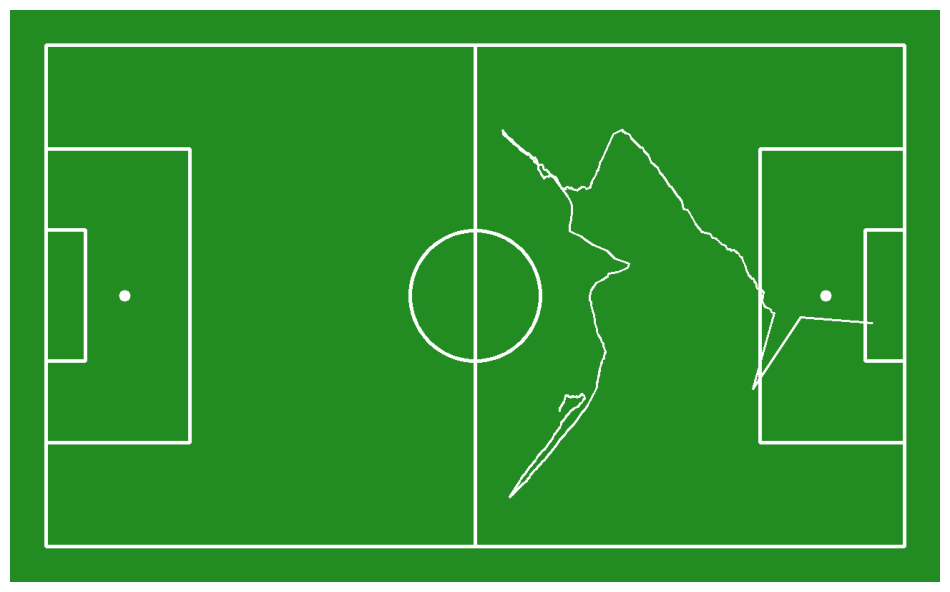

In [34]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [35]:
from typing import List, Union

def replace_outliers_based_on_distance(
    positions: List[np.ndarray],
    distance_threshold: float
) -> List[np.ndarray]:
    last_valid_position: Union[np.ndarray, None] = None
    cleaned_positions: List[np.ndarray] = []

    for position in positions:
        if len(position) == 0:
            # If the current position is already empty, just add it to the cleaned positions
            cleaned_positions.append(position)
        else:
            if last_valid_position is None:
                # If there's no valid last position, accept the first valid one
                cleaned_positions.append(position)
                last_valid_position = position
            else:
                # Calculate the distance from the last valid position
                distance = np.linalg.norm(position - last_valid_position)
                if distance > distance_threshold:
                    # Replace with empty array if the distance exceeds the threshold
                    cleaned_positions.append(np.array([], dtype=np.float64))
                else:
                    cleaned_positions.append(position)
                    last_valid_position = position

    return cleaned_positions

In [36]:
MAX_DISTANCE_THRESHOLD = 500

path = replace_outliers_based_on_distance(path, MAX_DISTANCE_THRESHOLD)

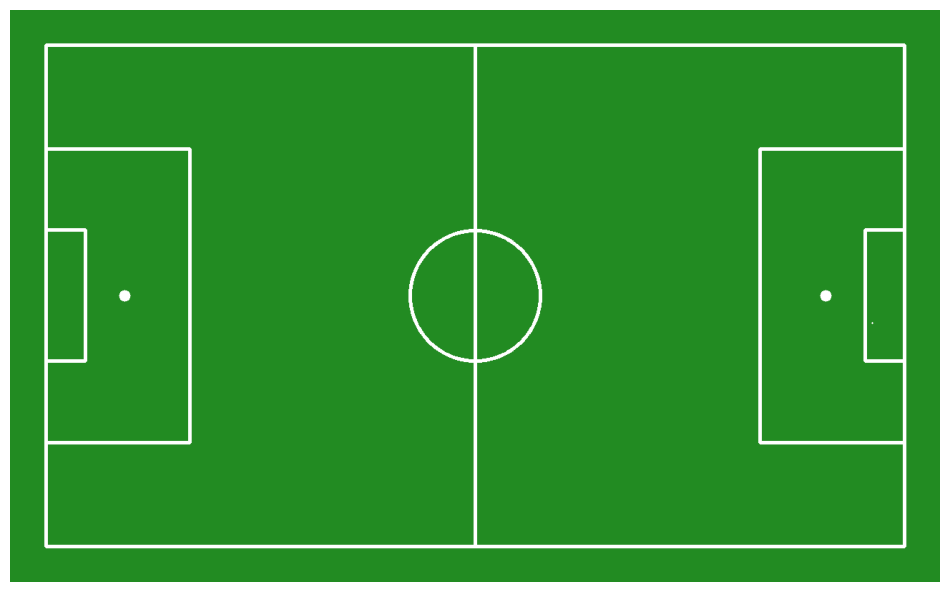

In [37]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)